# 106KS

#### ISS-placenta, figure generating notebook

In [18]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

import sys
import os
sys.path.append(os.path.join(os.path.abspath('.'),'../src/planktonpy/plankton'))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
import os
from PIL import Image
Image.MAX_IMAGE_PIXELS = 933120000

import numpy as np
import pandas as pd
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

# from krakenpy.src import kraken as pl
import plankton as pl
import scanpy as sc

### Load meta data:

In [20]:
data_folder='./../data/'
meta = pd.read_csv(os.path.join(data_folder,'meta-106KS.txt'),header=None,index_col=0).T 
meta

,sample,stage,tissue,state,panel,coordinate_file,background_file,um_p_px
1,106KS,late_term,villi,C,katja,106KS_Decoded_CP-pseudoanchor_all genes.csv,106KS_DAPI.tif,0.162507


### Load, normalize, subset snRNAseq AnnData:

In [21]:
snRNAseq_file = "/data/analysis/preeclampsia_2019/spatial_data/SP014_SP082_SP136_placenta_annotations_250322.h5ad"

adata_raw= sc.read_h5ad(snRNAseq_file)
adata_full= adata_raw.raw.to_adata()
adata_norm=adata_full.copy()
sc.pp.normalize_total(adata_norm)
sc.pp.log1p(adata_norm)

In [22]:
subset = (adata_full.obs.disease==meta.state[1]) & \
         (adata_full.obs.time==meta.stage[1]) & \
         (adata_full.obs.tissue==meta.tissue[1])


adata106 = adata_full[subset]

### Load coordinates & backgrounds:

In [23]:
um_p_px = float(meta.um_p_px[1])

coordinates = pd.read_csv(os.path.join(data_folder,meta.coordinate_file.values[0]),)
coordinates.X*=um_p_px
coordinates.Y*=um_p_px

bg = Image.open(os.path.join(data_folder,meta.background_file.values[0]),) 
bg = bg.resize((bg.width//4,bg.height//4),Image.ANTIALIAS)
bg = np.array(bg.getdata()).reshape((bg.height,bg.width,-1)).sum(-1)
bg = bg-bg.min()
bg = bg/bg.max()
bg = bg.T**0.4
bg = 1-bg
# bg[bg<0.7]=0

bgmap = pl.PixelMap(bg,upscale=0.25/um_p_px)


### Create pl object:

In [24]:
x_=100
y_=30
sample_height=1000
sample_width=800

sdata106 = pl.SpatialData(coordinates.gene, 
                         coordinates.Y,
                         coordinates.X,
#                        scanpy=adata106,
                        pixel_maps=[bgmap])

sdata106 = sdata106[sdata106.g.isin([g for g in sdata106.genes if g[:3]!='MT-'])]
# sdata106.obsc = sdata106.obsc.drop([g for g in sdata106.genes if g[:3]=='MT-'])



(<matplotlib.collections.PathCollection at 0x2b0940a74bb0>, None, None)

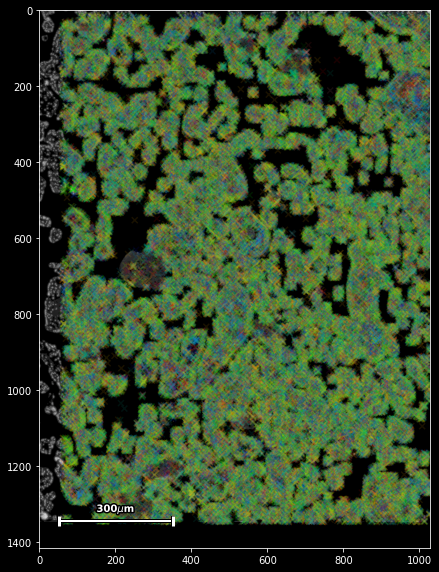

In [25]:
plt.style.use('dark_background')

plt.figure(figsize=(7,12))
# ax1=plt.subplot(121)

sdata106.scatter(alpha=0.1,marker='x')

# plt.subplot(122)
# pl.hbar_compare(sdata106.stats,sdata106.scanpy.stats)

In [26]:
# data_folder='./../data/figure-data/107KS/'
meta = pd.read_csv(os.path.join(data_folder,'meta-107KS.txt'),header=None,index_col=0).T 
meta

,sample,stage,tissue,state,panel,coordinate_file,background_file,um_p_px
1,107KS,late_preterm,villi,PE,placenta,107KS_Decoded.csv,107KS_DAPI.tif,0.162507


### Load, normalize, subset snRNAseq AnnData:

In [27]:
snRNAseq_file = "/data/analysis/preeclampsia_2019/spatial_data/SP014_SP082_SP136_placenta_annotations_250322.h5ad"

adata_raw= sc.read_h5ad(snRNAseq_file)
adata_full= adata_raw.raw.to_adata()
adata_norm=adata_full.copy()
sc.pp.normalize_total(adata_norm)
sc.pp.log1p(adata_norm)

In [28]:
subset = (adata_full.obs.disease==meta.state[1]) & \
         (adata_full.obs.time==meta.stage[1]) & \
         (adata_full.obs.tissue==meta.tissue[1])


adata107 = adata_full[subset]

### Load coordinates & backgrounds:

In [29]:
um_p_px = float(meta.um_p_px[1])

coordinates = pd.read_csv(os.path.join(data_folder,meta.coordinate_file.values[0]),)
coordinates.X*=um_p_px
coordinates.Y*=um_p_px

bg = Image.open(os.path.join(data_folder,meta.background_file.values[0]),) 
bg = bg.resize((bg.width//4,bg.height//4),Image.ANTIALIAS)
bg = np.array(bg.getdata()).reshape((bg.height,bg.width,-1)).sum(-1)
bg = bg-bg.min()
bg = bg/bg.max()
bg = bg.T**0.4
bg = 1-bg
# bg[bg<0.7]=0

bgmap = pl.PixelMap(bg,upscale=0.25/um_p_px)


### Create pl object:

In [30]:
x_=100
y_=30
sample_height=1000
sample_width=800

sdata107 = pl.SpatialData(coordinates.gene, 
                         coordinates.Y,
                         coordinates.X,
#                        scanpy=adata107,
                        pixel_maps=[bgmap])

sdata107=sdata107[sdata107.g.isin(sdata106.genes.intersection(sdata107.genes))]
sdata107 = sdata107[sdata107.g.isin([g for g in sdata107.genes if g[:3]!='MT-'])]
# sdata107.obsc = sdata107.obsc.drop([g for g in sdata107.genes if g[:3]=='MT-'])



(<matplotlib.collections.PathCollection at 0x2b0b59418d90>, None, None)

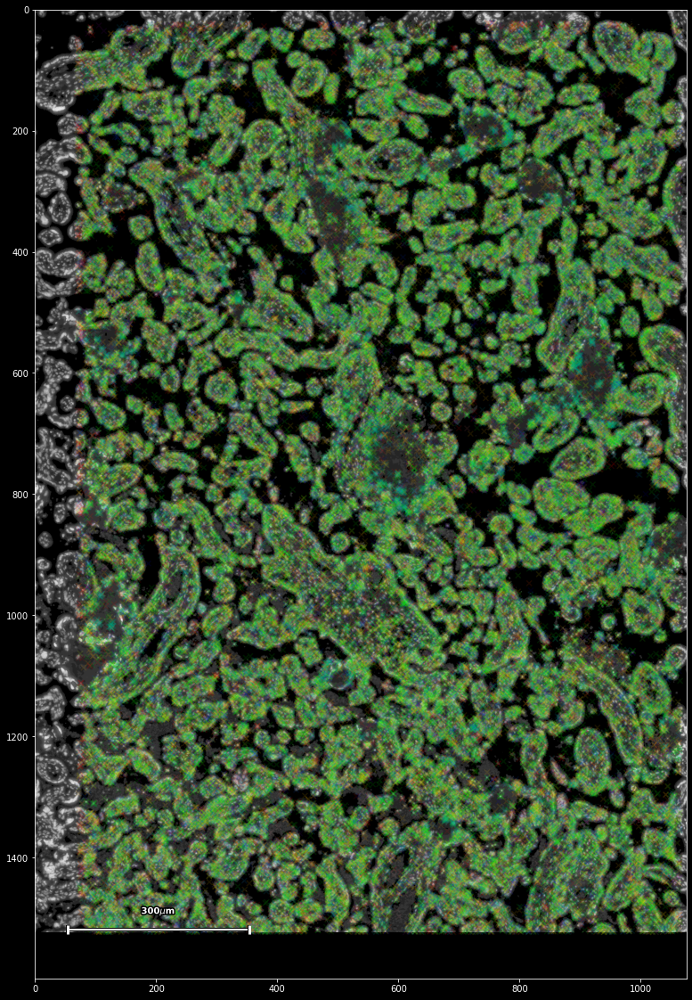

In [31]:
plt.figure(figsize=(15,20))
# ax1=plt.subplot(121)

sdata107.scatter(alpha=0.1,marker='x',)

# plt.subplot(122)
# pl.hbar_compare(sdata107.stats,sdata107.scanpy.stats)




In [32]:
bg1 = pl.PixelMap((np.array([(1-sdata106.pixel_maps[-1].data)*0.3,(1-sdata106.pixel_maps[-1].data)*0.3,1-sdata106.pixel_maps[-1].data]).transpose([1,2,0])),upscale=0.25/um_p_px)
sdata106.pixel_maps.insert(0,bg1)



In [33]:
bg1 = pl.PixelMap((np.array([(1-sdata107.pixel_maps[-1].data)*0.3,(1-sdata107.pixel_maps[-1].data)*0.3,1-sdata107.pixel_maps[-1].data]).transpose([1,2,0])),upscale=0.25/um_p_px)
sdata107.pixel_maps.insert(0,bg1)



### Creating villi-wall masks

The following sections create villi wall masks using the difference-of-gaussian filters of scikit-image:

In [34]:
import skimage


from skimage.filters import difference_of_gaussians, gaussian ,window
from skimage import feature
from scipy.fft import fftn, fftshift


fgimage=gaussian(sdata106.pixel_maps[-1].data,2.)
# fimage=difference_of_gaussians(bg,10,50)
edges1 = feature.canny(fgimage,sigma=3.7)

th_wall=5
th_env=5


edge_coords = np.array(np.where(edges1)).T
edge_coords = edge_coords[(edge_coords[:,0]!=1)&(edge_coords[:,1]!=1)&(edge_coords[:,0]!=(edges1.shape[0]-2))&(edge_coords[:,1]!=edges1.shape[1]-2)]*um_p_px*4

from sklearn.neighbors import NearestNeighbors

knn = NearestNeighbors(n_neighbors=3).fit(edge_coords)
distance_to_wall_106,wall_neighbor=knn.kneighbors(np.array(sdata106.coordinates)[:,::-1],n_neighbors=1)


wall_mask_106=(distance_to_wall_106<th_wall).flatten()
wall_mask_wide_106=(distance_to_wall_106<th_env).flatten()


sdata106wall = sdata106[wall_mask_106]



# plt.savefig('../output/wall_filter_illustration.png')
# plt.savefig('../output/wall_filter_illustration.pdf')

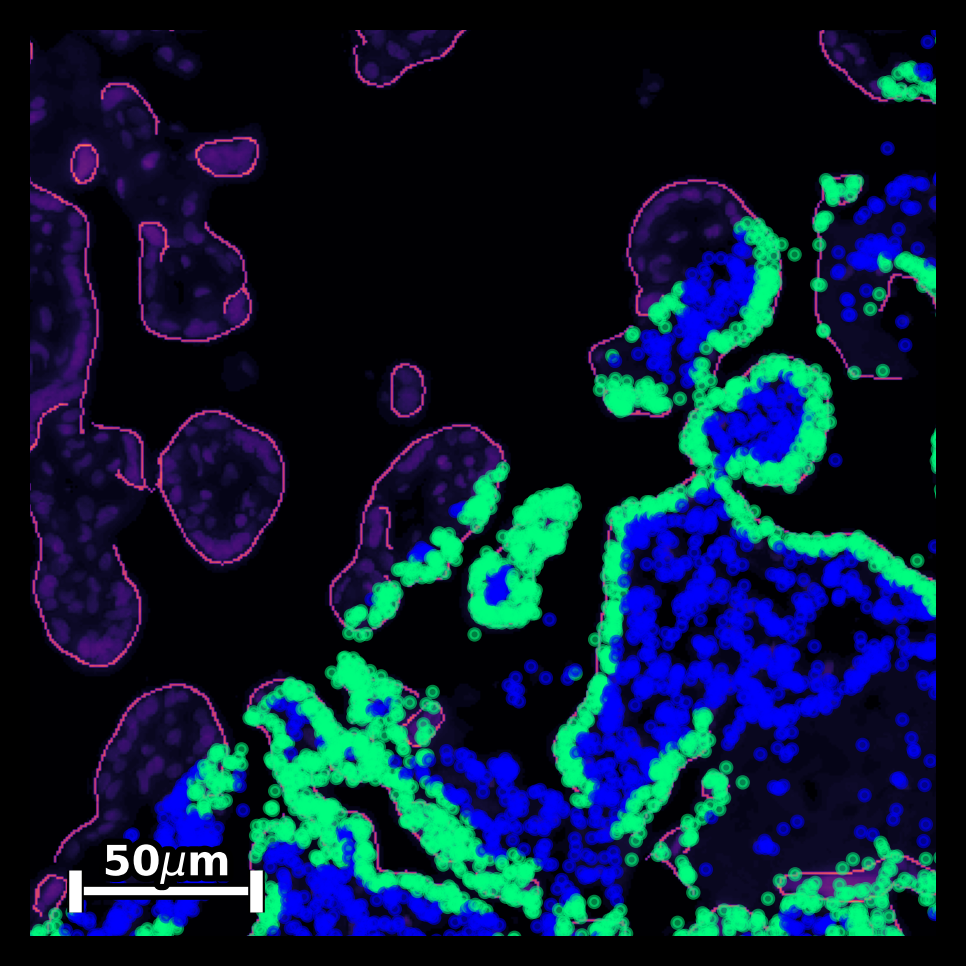

In [35]:
import skimage


from skimage.filters import difference_of_gaussians, gaussian ,window
from skimage import feature
from scipy.fft import fftn, fftshift


fgimage=gaussian(sdata106.pixel_maps[-1].data,2.)
# fimage=difference_of_gaussians(bg,10,50)
edges1 = feature.canny(fgimage,sigma=3.7)

th_wall=5
th_env=5

plt.figure(figsize=(4,4),dpi=300)

# plt.subplot(121)

plt.imshow(((edges1>0.05)*1-sdata106.pixel_maps[-1].data**0.8),cmap='magma',extent=np.array(sdata106.pixel_maps[-1].extent)[[2,3,0,1]])

plt.xlim(100,350,)
plt.ylim(100,350,)

coords = sdata106.coordinates.T#spatial[300:650,500:850].coordinates
diagonal_mask=np.subtract(coords[0],coords[1].max()-coords[1])>0
plt.scatter((coords[0])[diagonal_mask],(coords[1].max()-coords[1])[diagonal_mask],c=wall_mask_106[diagonal_mask],s=6,cmap='winter',alpha=0.5)

sdata106.add_scalebar()
plt.axis('off')

plt.savefig('../output/wall_filter_illustration_diagonal-C.png',dpi=300)
plt.savefig('../output/wall_filter_illustration_diagonal-C.svg',dpi=300)
plt.savefig('../output/wall_filter_illustration_diagonal-C.pdf',dpi=300)

In [36]:
import skimage


from skimage.filters import difference_of_gaussians, gaussian ,window
from skimage import feature
from scipy.fft import fftn, fftshift


fgimage=gaussian(sdata107.pixel_maps[-1].data,2.9)
# fimage=difference_of_gaussians(bg,10,50)
edges1 = feature.canny(fgimage,sigma=4.6)



edge_coords = np.array(np.where(edges1)).T
edge_coords = edge_coords[(edge_coords[:,0]!=1)&(edge_coords[:,1]!=1)&(edge_coords[:,0]!=(edges1.shape[0]-2))&(edge_coords[:,1]!=edges1.shape[1]-2)]*um_p_px*4


knn = NearestNeighbors(n_neighbors=3).fit(edge_coords)
distance_to_wall,wall_neighbor=knn.kneighbors(np.array(sdata107.coordinates)[:,::-1],n_neighbors=1)

wall_mask_107=(distance_to_wall<th_wall).flatten()
wall_mask_wide_107=(distance_to_wall<th_env).flatten()

sdata107wall = sdata107[wall_mask_107]



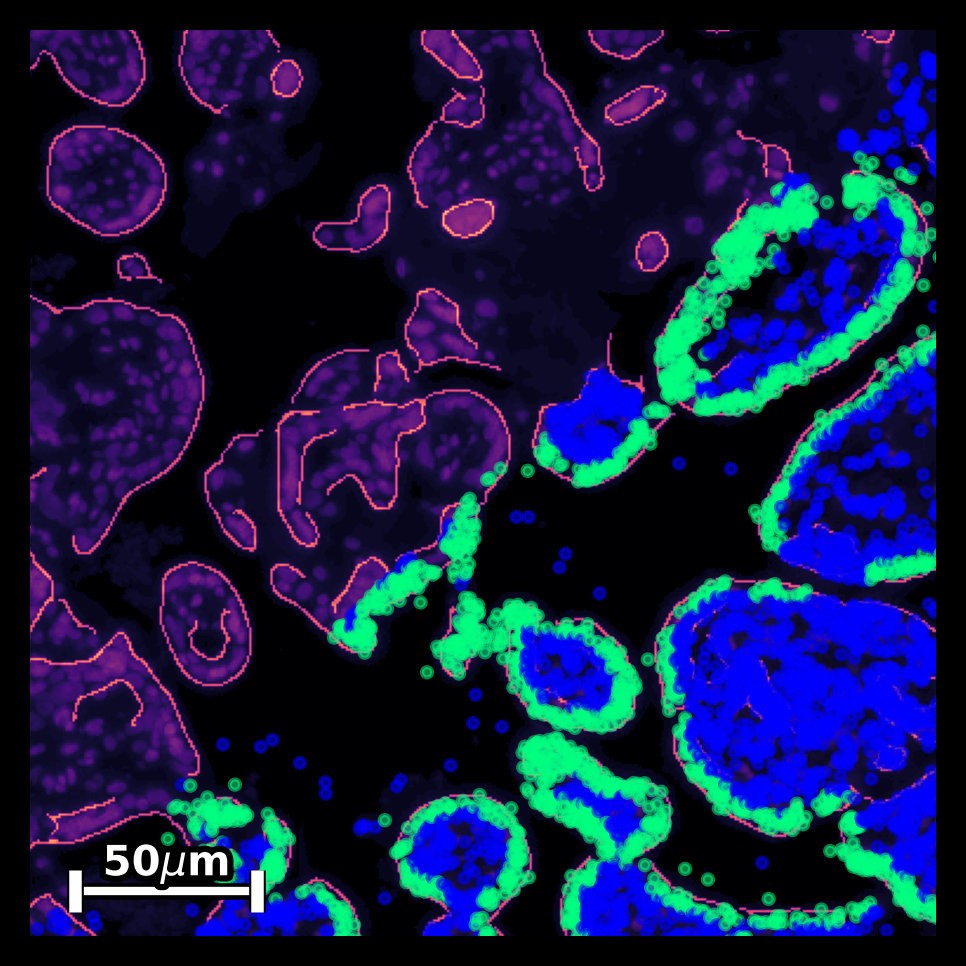

In [37]:
import skimage


from skimage.filters import difference_of_gaussians, gaussian ,window
from skimage import feature
from scipy.fft import fftn, fftshift


fgimage=gaussian(sdata107.pixel_maps[-1].data,2.)
# fimage=difference_of_gaussians(bg,10,50)
edges1 = feature.canny(fgimage,sigma=3.7)

th_wall=5
th_env=5

plt.figure(figsize=(4,4),dpi=300)

# plt.subplot(121)

plt.imshow(((edges1>0.05)*1-sdata107.pixel_maps[-1].data**0.8),cmap='magma',extent=np.array(sdata107.pixel_maps[-1].extent)[[2,3,0,1]])

plt.xlim(650,900,)
plt.ylim(650,900,)

coords = sdata107.coordinates.T#spatial[300:650,500:850].coordinates
diagonal_mask=np.subtract(coords[0],coords[1].max()-coords[1])>0


plt.scatter((coords[0])[diagonal_mask],(coords[1].max()-coords[1])[diagonal_mask],c=wall_mask_107[diagonal_mask],s=6,cmap='winter',alpha=0.5)

plt.axis('off')
sdata107.add_scalebar()

plt.savefig('../output/wall_filter_illustration_diagonal-PE.png',dpi=300)
plt.savefig('../output/wall_filter_illustration_diagonal-PE.svg',dpi=300)
plt.savefig('../output/wall_filter_illustration_diagonal-PE.pdf',dpi=300)

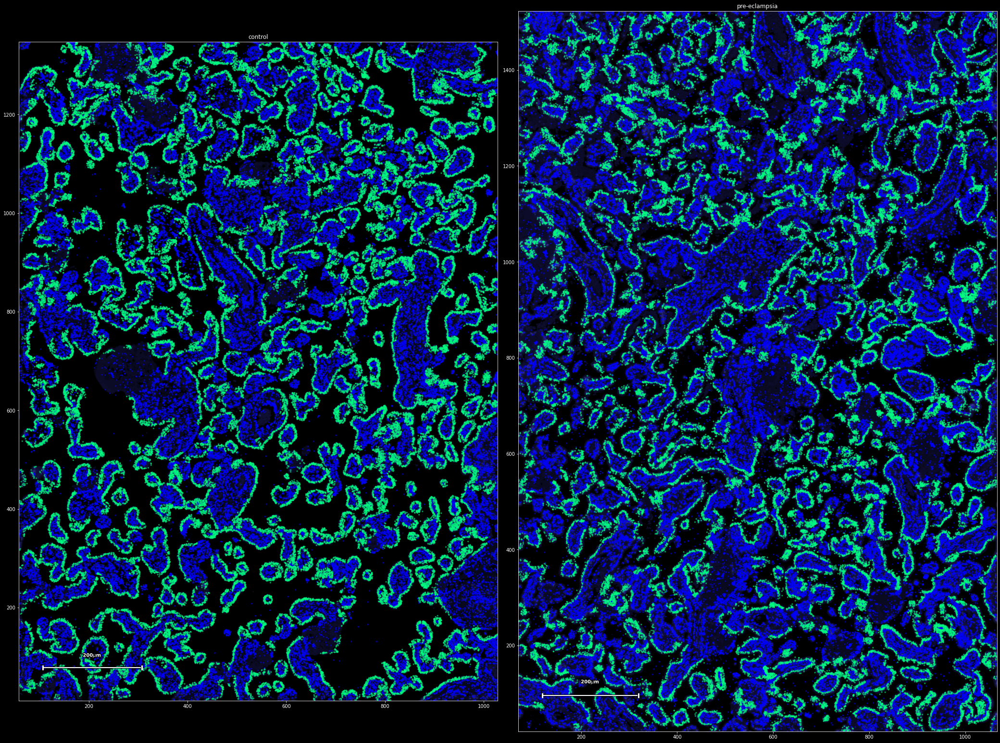

In [38]:
plt.figure(figsize=(29,24))

plt.subplot(121)


plt.title('control')
plt.xlim(sdata106.x.min(),sdata106.x.max())
plt.ylim(sdata106.y.min(),sdata106.y.max())
sdata106.scatter(marker='.',c=wall_mask_106,s=20,cmap='winter',alpha=0.5)


plt.subplot(122)

plt.title('pre-eclampsia')
plt.xlim(sdata107.x.min(),sdata107.x.max())
plt.ylim(sdata107.y.min(),sdata107.y.max())

sdata107.scatter(marker='.',c=wall_mask_107,s=20,cmap='winter',alpha=0.5)

plt.tight_layout()

# plt.savefig('../output/wall_filter_wide.png')
# plt.savefig('../output/wall_filter_wide.svg')

### Creating illustrations of senescence/vascularizations markers within wall-masked areas:

In [39]:
sdata106.graph.update_knn(800)

In [41]:
sdata107.graph.update_knn(800)

In [42]:
vascular = ['IDO2','ZEB1','TEK','CDH5','KDR']
senescence = ['MMP11','INHBA']
trophoblast=['LGR5','FGFR2','MET']

def create_colors(labels):
    
    if type(labels) == str:
        if labels=='senescence':
            return('gold')
        elif labels=='vascular':
            return('red')
        elif labels=='trophoblast':
            return('violet')
        elif labels=='other':
            return([0.9,0.9,0.9,0.6])
        else:
            return('lightgray')
    
    colors = []
    for i,l in enumerate(labels):
        if l in vascular:
            colors.append(create_colors('vascular'))
        elif l in senescence:
            colors.append(create_colors('senescence'))
#         elif l in ['FN1', 'FSTL1','BGN']:
#             colors.append('cyan')
        elif l in trophoblast:
            colors.append(create_colors('trophoblast'))
        else:
            colors.append('grey')
    return(colors)


In [43]:
def create_legend(labels=['vascular','senescence','trophoblast','other']):
    plt.legend([plt.scatter([],[],color=create_colors(l)) for l in labels],labels)

<IPython.core.display.Javascript object>


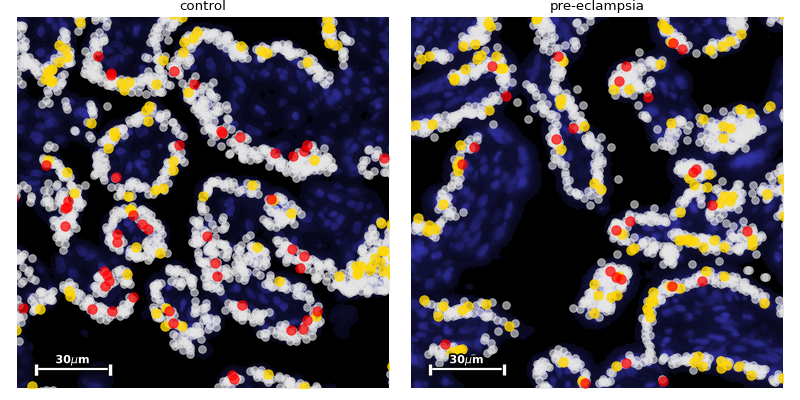

In [44]:
%matplotlib notebook

plt.style.use('default')

plt.figure(figsize=(10,5))

s=70

plt.subplot(121)

plt.xlim(700,850);plt.ylim(950,800)

plt.title('control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+vascular)].coordinates.T,color=create_colors('other'),s=s**0.9,)
sdata106wall[sdata106wall.g.isin(senescence)].scatter(color=create_colors('senescence'), marker='o',s=s,legend=False,alpha=0.8)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]


plt.axis('off')

ax1=plt.gca()
sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim(550,700);plt.ylim(350,500)

plt.title('pre-eclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9)
handlers1=sdata107wall[sdata107wall.g.isin(senescence)].scatter(legend=False, color=create_colors('senescence'),alpha=0.8, marker='o',s=s,scalebar=True)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
plt.axis('off')
plt.tight_layout()

# plt.savefig('../output/final-figures/figure4//sample-close.png')
# plt.savefig('../output/final-figures/figure4/sample-close.svg')

In [45]:
# plt.savefig('../output/final-figures/figure4//sample-close.png',dpi=300)
# plt.savefig('../output/final-figures/figure4/sample-close.svg',dpi=300)
# plt.savefig('../output/final-figures/figure4/sample-close.pdf',dpi=300)

<IPython.core.display.Javascript object>


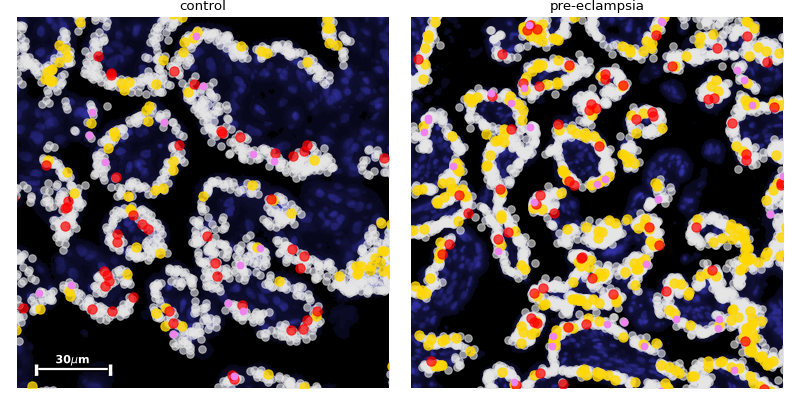

In [46]:
# %matplotlib notebook

plt.style.use('default')

plt.figure(figsize=(10,5))

s=70

plt.subplot(121)

plt.xlim(700,850);plt.ylim(950,800)

plt.title('control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+vascular)].coordinates.T,color=create_colors('other'),s=s**0.9,)
sdata106wall[sdata106wall.g.isin(senescence)].scatter(color=create_colors('senescence'), marker='o',s=s,legend=False,alpha=0.8)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]
sdata106wall[sdata106wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o')

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]


plt.axis('off')

ax1=plt.gca()
sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim(550,800);plt.ylim(350,600)

plt.title('pre-eclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9)
sdata107wall[sdata107wall.g.isin(senescence)].scatter(legend=False, color=create_colors('senescence'),alpha=0.8, marker='o',s=s,scalebar=False)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]
sdata107wall[sdata107wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o', scalebar=False)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
plt.axis('off')
plt.tight_layout()

# plt.savefig('../output/final-figures/figure4//sample-close-tropho.png')
# plt.savefig('../output/final-figures/figure4/sample-close-tropho.svg')

<IPython.core.display.Javascript object>


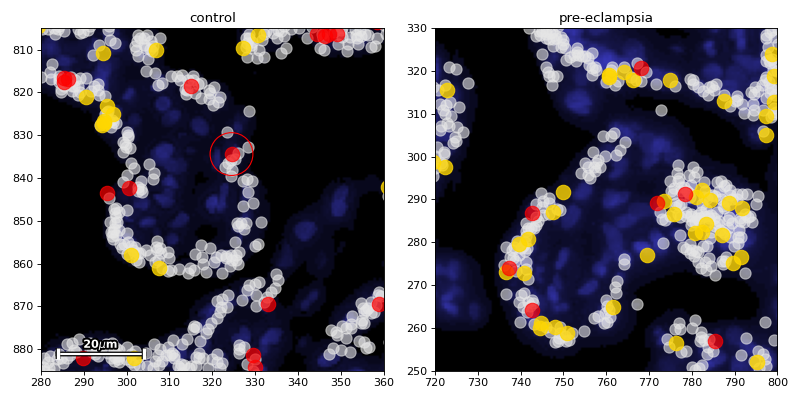

In [47]:
%matplotlib notebook

plt.style.use('default')

# vasc = ['IDO2','ZEB1','TEK','CDH5','KDR']

plt.figure(figsize=(10,5))

s=170

ax1 = plt.subplot(121)

plt.xlim(280,360);plt.ylim(885,805)
# plt.subplot(121)
plt.title('control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+vascular)].coordinates.T,color=create_colors('other'),s=s**0.9,)
sdata106wall[sdata106wall.g.isin(senescence)].scatter(color=create_colors('senescence'), marker='o',s=s,legend=False,alpha=0.8)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]
# sdata106wall[sdata106wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o')

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax1.add_artist(plt.Circle([324.5,834.4],5,color='r',fill=False))
# plt.axis('off')

ax1=plt.gca()
sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim(720,800);plt.ylim(250,330)


# plt.subplot(121)
plt.title('pre-eclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9)
sdata107wall[sdata107wall.g.isin(senescence)].scatter(legend=False, color=create_colors('senescence'),alpha=0.8, marker='o',s=s,scalebar=False)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.7,marker='o',s=s )]
# sdata107wall[sdata107wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('tropho'), marker='o', scalebar=False)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
# plt.axis('off')
plt.tight_layout()

plt.savefig('../output/sample-close.png',dpi=300)
plt.savefig('../output/sample-close.pdf',dpi=300)

<IPython.core.display.Javascript object>


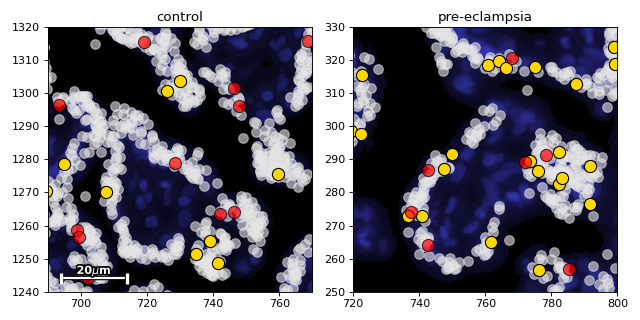

In [53]:
%matplotlib notebook

plt.style.use('default')

# vasc = ['IDO2','ZEB1','TEK','CDH5','KDR']

plt.figure(figsize=(8,4))

s=120

ax1 = plt.subplot(121)

plt.xlim(690,770);plt.ylim(1240,1320)
# plt.subplot(121)
# plt.title('control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+vascular)].coordinates.T,color=create_colors('other'),s=s**0.9,)
sdata106wall[sdata106wall.g.isin(['INHBA'])].scatter(color=create_colors('senescence'), edgecolors='k',marker='o',s=s,legend=False,alpha=1.0,scalebar=False)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),edgecolors='k',alpha=0.7,marker='o',s=s )]
# sdata106wall[sdata106wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o')

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax1.add_artist(plt.Circle([324.5,834.4],5,color='r',fill=False))
plt.axis('off')

ax1=plt.gca()
# sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim(720,800);plt.ylim(250,330)


# plt.subplot(121)
# plt.title('pre-eclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9)
sdata107wall[sdata107wall.g.isin(['INHBA'])].scatter(legend=False, color=create_colors('senescence'),edgecolors='k',alpha=1.0, marker='o',s=s,scalebar=False)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),edgecolors='k',alpha=0.7,marker='o',s=s )]
# sdata107wall[sdata107wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('tropho'), marker='o', scalebar=False)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
plt.axis('off')
plt.tight_layout()

# plt.savefig('../output/sample-close.png',dpi=300)
# plt.savefig('../output/sample-close.pdf',dpi=300)
plt.savefig('../output/sample-close-no-text.png',dpi=300)
plt.savefig('../output/sample-close-no-text.pdf',dpi=300)

In [ ]:
plt.figure()
plt.Circle([325,824],5,color='r')


In [ ]:
%matplotlib inline

plt.style.use('default')

vasc = ['IDO2','ZEB1','TEK','CDH5','KDR']

plt.figure(figsize=(17,15))

s=30

plt.subplot(121)

plt.xlim([100,800]);plt.ylim([50,1000])
# plt.subplot(121)
plt.title('late control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+list(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9,alpha=0.9)
sdata106wall[sdata106wall.g.isin(['INHBA'])].scatter(color=create_colors('senescence'),edgecolors='k', marker='o',s=s,scalebar=False,legend=False,alpha=0.8)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),edgecolors='k',alpha=0.8,marker='o',s=s )]
# sdata106wall[sdata106wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('tropho'), marker='o',s=s)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]


plt.axis('off')

ax1=plt.gca()
# sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim([100,800]);plt.ylim([50,1000])


# plt.subplot(121)
plt.title('early onset preeclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+list(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9,alpha=0.9)
sdata107wall[sdata107wall.g.isin(['INHBA'])].scatter(legend=False, color=create_colors('senescence'),edgecolors='k',alpha=0.8, marker='o',s=s,scalebar=True)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),edgecolors='k',alpha=0.8,marker='o',s=s )]
# sdata107wall[sdata107wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('tropho'), marker='o', scalebar=False,s=s)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
plt.axis('off')
plt.tight_layout()
# create_legend()


# plt.savefig('../output/sample-senescence-wide.png',dpi=300)
# plt.savefig('../output/sample-senescence-wide.pdf',dpi=300)

plt.savefig('../output/sample-senescence-wide-no-text.png',dpi=300)
plt.savefig('../output/sample-senescence-wide-no-text.pdf',dpi=300)
# plt.savefig('../output/final-figures/sups/sample-senescence-wide.svg',dpi=300)

In [ ]:
%matplotlib inline

plt.style.use('default')

vasc = ['IDO2','ZEB1','TEK','CDH5','KDR']

plt.figure(figsize=(17,15))

s=34

plt.subplot(121)

plt.xlim([100,800]);plt.ylim([50,1000])
# plt.subplot(121)
plt.title('late control')

plt.scatter(*sdata106wall[~sdata106wall.g.isin(senescence+list(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9,alpha=0.9)
sdata106wall[sdata106wall.g.isin(senescence)].scatter(color=create_colors('senescence'), marker='o',s=s,legend=False,alpha=0.8)
handlers = [plt.scatter(*sdata106[wall_mask_wide_106][sdata106[wall_mask_wide_106].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.8,marker='o',s=s )]
sdata106wall[sdata106wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o',s=s)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]


plt.axis('off')

ax1=plt.gca()
# sdata106wall.add_scalebar(axd=ax1)

plt.subplot(122)

plt.xlim([100,800]);plt.ylim([50,1000])


# plt.subplot(121)
plt.title('early onset preeclampsia')

plt.scatter(*sdata107wall[~sdata107wall.g.isin(senescence+list(vascular))].coordinates.T,color=create_colors('other'),s=s**0.9,alpha=0.9)
sdata107wall[sdata107wall.g.isin(senescence)].scatter(legend=False, color=create_colors('senescence'),alpha=0.8, marker='o',s=s,scalebar=True)
handlers = [plt.scatter(*sdata107[wall_mask_wide_107][sdata107[wall_mask_wide_107].g.isin(vascular)].coordinates.T,color=create_colors('vascular'),alpha=0.8,marker='o',s=s )]
sdata107wall[sdata107wall.g.isin(trophoblast)].scatter(legend=False, c=create_colors('trophoblast'), marker='o', scalebar=False,s=s)

handlers+=[plt.scatter([],[],color=c, marker='o',s=s) for c in [create_colors('senescence'),create_colors('other')]]

ax2=plt.gca()
plt.axis('off')
plt.tight_layout()
# create_legend()


# plt.savefig('../output/final-figures/sups/sample-senescence-wide-tropho.png',dpi=300)
# plt.savefig('../output/final-figures/sups/sample-senescence-wide-tropho.pdf',dpi=300)
# plt.savefig('../output/final-figures/sups/sample-senescence-wide-tropho.svg',dpi=300)

In [ ]:
# only wall vascs:

vasc_prox_106 = []
pd_lbls_106 = []

for max_distance in [5]:
    
    mask=sdata106.graph.distances<max_distance
    
    mask_vasc = np.zeros_like(mask)
    
    for v in vasc:
        mask_vasc[sdata106.graph.neighbor_types==sdata106.get_id(v)]=True
    
    mask[~(mask_vasc&(wall_mask_wide_106[:,None]))]=False
    
    mask[:,0]=False
    
    for i,g in enumerate(sdata106.genes):

        vasc_prox_106.append(mask[(sdata106.g==g)&wall_mask_106].sum(1)>0)
        pd_lbls_106+=[i]*len(vasc_prox_106[-1])

    break

concatenated106=np.concatenate(vasc_prox_106)    

In [ ]:
# only wall vascs:

vasc = ['IDO2','ZEB1','TEK','CDH5','KDR']

vasc_prox_107 = []
pd_lbls_107 = []

for max_distance in [5]:
    
    mask=sdata107.graph.distances<max_distance
    
    mask_vasc = np.zeros_like(mask)
    
    for v in vasc:
        mask_vasc[sdata107.graph.neighbor_types==sdata107.get_id(v)]=True
    
    mask[~(mask_vasc&(wall_mask_wide_107[:,None]))]=False
    
    mask[:,0]=False
    
    for i,g in enumerate(sdata107.genes):

        vasc_prox_107.append(mask[(sdata107.g==g)&wall_mask_107].sum(1)>0)
        pd_lbls_107+=[i]*len(vasc_prox_107[-1])

    break

concatenated107=np.concatenate(vasc_prox_107)

### Statistical analysis of vascularization/senescence markers within villi walls:

The following cells contain statistical analysis and figure gernators for the statistical analysis of vascularization and senescence markers in healthy and pre-eclamptic tissues. Distributions of molecules within/outside the proximity of vascularization markers. Ocurrences in both spatial categories (within/outside) are compared per gene in a binomial model.

In [ ]:
from scipy.stats import  binom

plt.figure(figsize=(22,5))

plt.style.use('default')

n=0
cooc106=np.array([v.mean() for v in vasc_prox_106])
poisson_likelihoods=np.array([v.mean()/v.var() for v in vasc_prox_106])


# ps=[poisson.cdf(vasc_prox_106[i].sum(),conced.mean()*len(vasc_prox_106[i])) for i in range(len(sdata106.genes))]
ps=[binom.cdf(vasc_prox_106[i].sum(),n=len(vasc_prox_106[i]),p=concatenated106.mean()) for i in range(len(sdata106.genes))]
cooc106=np.array(ps)

argidcs = np.argsort(cooc106)[::-1]
h1=plt.bar(np.arange(len(argidcs))-0.13,(cooc106)[argidcs],width=0.6,color='lemonchiffon')
# h1=plt.bar(np.arange(len(counts106))+0.13,(vals106/2)[argidcs],width=0.3,color='lightblue')

ticks,texts=plt.xticks(np.arange(len(sdata106.genes)),sdata107.genes[argidcs],rotation=90)
[h1.get_children()[i].set_color(c) for i,c in enumerate(create_colors(sdata107.genes[argidcs]))]
[texts[i].set_color(c) if c!= 'grey' else texts[i].set_color('k') for i,c in enumerate(create_colors(sdata106.genes[argidcs]))]

plt.tight_layout()
plt.ylabel('p ( obs > exp ) ')

create_legend()

# plt.savefig(f"../output/final-figures/sups/binomprob-bars-106-{max_distance}-um.png")
# plt.savefig(f"../output/final-figures/sups/binomprob-bars-106-{max_distance}-um.pdf")
# plt.savefig(f"../output/final-figures/sups/binomprob-bars-106-{max_distance}-um.svg")

In [ ]:
plt.figure(figsize=(22,5))

plt.style.use('default')

n=0
cooc107=np.array([v.mean() for v in vasc_prox_107])
poisson_likelihoods=np.array([v.mean()/v.var() for v in vasc_prox_107])


# ps=[poisson.cdf(vasc_prox_107[i].sum(),conced.mean()*len(vasc_prox_107[i])) for i in range(len(sdata107.genes))]
ps=[binom.cdf(vasc_prox_107[i].sum(),n=len(vasc_prox_107[i]),p=concatenated107.mean()) for i in range(len(sdata107.genes))]
cooc107=np.array(ps)

argidcs = np.argsort(cooc107)[::-1]
h1=plt.bar(np.arange(len(argidcs))-0.13,(cooc107)[argidcs],width=0.6,color='lemonchiffon')
# h1=plt.bar(np.arange(len(counts107))+0.13,(vals107/2)[argidcs],width=0.3,color='lightblue')

ticks,texts=plt.xticks(np.arange(len(sdata107.genes)),sdata107.genes[argidcs],rotation=90)
[h1.get_children()[i].set_color(c) for i,c in enumerate(create_colors(sdata107.genes[argidcs]))]
[texts[i].set_color(c) if c!= 'grey' else texts[i].set_color('k') for i,c in enumerate(create_colors(sdata107.genes[argidcs]))]

plt.tight_layout()
plt.ylabel('p ( obs > exp ) ')
    
create_legend()

    
# plt.savefig(f"../output/final-figures/sups/binomprob-bars-107-{max_distance}-um.png")
# plt.savefig(f"../output/final-figures/sups/binomprob-bars-107-{max_distance}-um.pdf")
# plt.savefig(f"../output/final-figures/sups/binomprob-bars-107-{max_distance}-um.svg")

In [ ]:
# os.mkdir('../output/final-figures/fig1')



In [ ]:
plt.figure(figsize=(4,5))

plt.style.use('default')

n=0

plt.xlim(-0.6,1.6)
display=vascular+trophoblast+senescence
display_idcs=np.array([sdata106.get_id(d) for d in display])

scbar = plt.plot([0.0,0.0],[0,1],c='Grey', linewidth=2)
plt.scatter([0,0,0],[0,0.5,1],c='Grey',marker='_')


ps=[binom.cdf(vasc_prox_106[i].sum(),n=len(vasc_prox_106[i]),p=concatenated106.mean()) for i in range(len(sdata106.genes))]
cooc106=np.array(ps)

argidcs = np.argsort(cooc106)[::-1]

for i,idx in enumerate(display_idcs):
    txt=sdata106.genes[idx]
#     print(txt)
    ha=['left','right'][i%2]
    va=['bottom','top','center','bottom','top'][i%5]
    color=create_colors([txt])[0]
    plt.scatter(0,cooc106[idx],color=color)
    plt.text(0,cooc106[idx],f'  {txt}  ',c=color,ha=ha,va=va)
    
    

scbar = plt.plot([1,1],[0,1],c='Grey', linewidth=2)
plt.scatter([1,1,1],[0,0.5,1],c='Grey',marker='_')


ps=[binom.cdf(vasc_prox_107[i].sum(),n=len(vasc_prox_107[i]),p=concatenated107.mean()) for i in range(len(sdata107.genes))]
cooc107=np.array(ps)

argidcs = np.argsort(cooc107)[::-1]

for i,idx in enumerate(display_idcs):
    txt=sdata106.genes[idx]
    ha=['left','right'][i%2]
#     va=['top,]
    color=create_colors([txt])[0]
    plt.scatter(1,cooc107[idx],color=color)
    plt.text(1,cooc107[idx],f'  {txt}  ',c=color,ha=ha)

plt.xticks([0,1,],['control','pre-eclampsia'])
plt.ylabel('p ( obs > exp ) ')

# plt.savefig('../output/final-figures/figure4/binomprob.png')
# plt.savefig('../output/final-figures/figure4/binomprob.svg')

